In [1]:
import numpy as np
import pandas as pd
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
import plotly.graph_objs as go
import cufflinks as cf
print (__version__) # requires version >= 1.9.0

#Always run this the command before at the start of notebook
init_notebook_mode(connected=True)

2.7.0


In [2]:
from sklearn import tree
import graphviz
import pydotplus
from IPython.display import Image 
import re
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier

In [3]:
train_data=pd.read_csv("Data/train.csv")
test_data=pd.read_csv("Data/test.csv")

In [4]:
train_data.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count'],
      dtype='object')

In [5]:
test_data.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed'],
      dtype='object')

In [6]:
test_data['registered']=0
test_data['casual']=0
test_data['count']=0

In [7]:
test_data.head(10)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,registered,casual,count
0,2011-01-20 00:00:00,1,0,1,1,10.66,11.365,56,26.0027,0,0,0
1,2011-01-20 01:00:00,1,0,1,1,10.66,13.635,56,0.0000,0,0,0
2,2011-01-20 02:00:00,1,0,1,1,10.66,13.635,56,0.0000,0,0,0
3,2011-01-20 03:00:00,1,0,1,1,10.66,12.880,56,11.0014,0,0,0
4,2011-01-20 04:00:00,1,0,1,1,10.66,12.880,56,11.0014,0,0,0
5,2011-01-20 05:00:00,1,0,1,1,9.84,11.365,60,15.0013,0,0,0
6,2011-01-20 06:00:00,1,0,1,1,9.02,10.605,60,15.0013,0,0,0
7,2011-01-20 07:00:00,1,0,1,1,9.02,10.605,55,15.0013,0,0,0
8,2011-01-20 08:00:00,1,0,1,1,9.02,10.605,55,19.0012,0,0,0
9,2011-01-20 09:00:00,1,0,1,2,9.84,11.365,52,15.0013,0,0,0


In [8]:
total_data = pd.concat([train_data, test_data])

In [9]:
total_data.head(10)

,atemp,casual,count,datetime,holiday,humidity,registered,season,temp,weather,windspeed,workingday
0,14.395,3,16,2011-01-01 00:00:00,0,81,13,1,9.84,1,0.0000,0
1,13.635,8,40,2011-01-01 01:00:00,0,80,32,1,9.02,1,0.0000,0
2,13.635,5,32,2011-01-01 02:00:00,0,80,27,1,9.02,1,0.0000,0
3,14.395,3,13,2011-01-01 03:00:00,0,75,10,1,9.84,1,0.0000,0
4,14.395,0,1,2011-01-01 04:00:00,0,75,1,1,9.84,1,0.0000,0
5,12.880,0,1,2011-01-01 05:00:00,0,75,1,1,9.84,2,6.0032,0
6,13.635,2,2,2011-01-01 06:00:00,0,80,0,1,9.02,1,0.0000,0
7,12.880,1,3,2011-01-01 07:00:00,0,86,2,1,8.20,1,0.0000,0
8,14.395,1,8,2011-01-01 08:00:00,0,75,7,1,9.84,1,0.0000,0
9,17.425,8,14,2011-01-01 09:00:00,0,76,6,1,13.12,1,0.0000,0


In [10]:
total_data.describe()

,atemp,casual,count,holiday,humidity,registered,season,temp,weather,windspeed,workingday
count,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000,17379.000000
mean,23.788755,22.563726,119.999770,0.028770,62.722884,97.436044,2.501640,20.376474,1.425283,12.736540,0.682721
std,8.592511,43.210268,170.711941,0.167165,19.292983,141.251913,1.106918,7.894801,0.639357,8.196795,0.465431
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.820000,1.000000,0.000000,0.000000
25%,16.665000,0.000000,0.000000,0.000000,48.000000,0.000000,2.000000,13.940000,1.000000,7.001500,0.000000
50%,24.240000,3.000000,28.000000,0.000000,63.000000,23.000000,3.000000,20.500000,1.000000,12.998000,1.000000
75%,31.060000,26.000000,192.000000,0.000000,78.000000,155.000000,3.000000,27.060000,2.000000,16.997900,1.000000
max,50.000000,367.000000,977.000000,1.000000,100.000000,886.000000,4.000000,41.000000,4.000000,56.996900,1.000000


In [11]:
total_data.dtypes

atemp         float64
casual          int64
count           int64
datetime       object
holiday         int64
humidity        int64
registered      int64
season          int64
temp          float64
weather         int64
windspeed     float64
workingday      int64
dtype: object

In [12]:
total_data.isnull().sum()

atemp         0
casual        0
count         0
datetime      0
holiday       0
humidity      0
registered    0
season        0
temp          0
weather       0
windspeed     0
workingday    0
dtype: int64

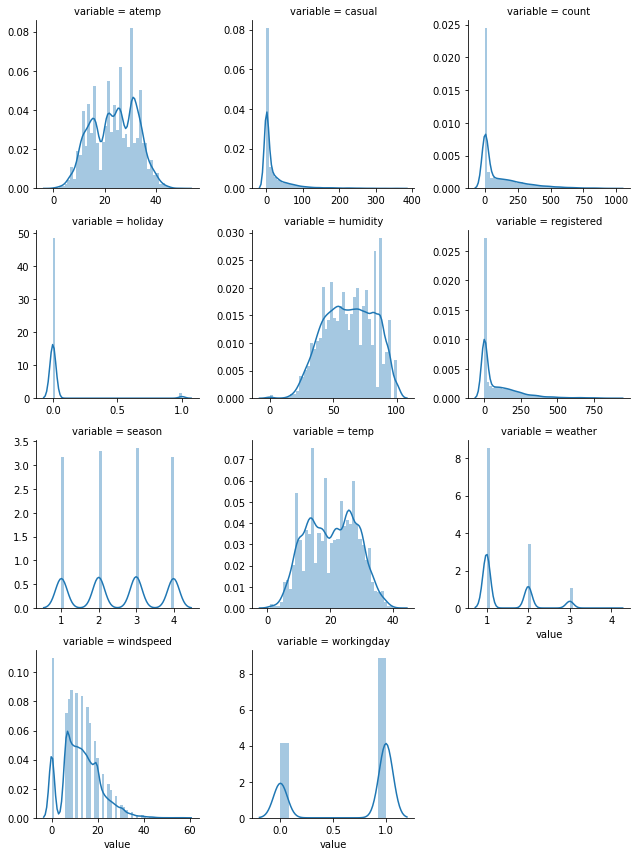

In [13]:
# Plots
import seaborn as sns
import matplotlib.pyplot as plt

f = pd.melt(total_data.loc[:, total_data.columns != 'datetime'])
g = sns.FacetGrid(f, col='variable', col_wrap=3, sharex=False, sharey=False)
g = g.map(sns.distplot,'value')
plt.show()

In [14]:
total_data.weather.value_counts()

1    11413
2     4544
3     1419
4        3
Name: weather, dtype: int64

In [15]:
# Convert discrete variables like holiday,weather,season,working day to factors 

total_data['holiday'] = total_data['holiday'].astype(object)
total_data['weather'] = total_data['weather'].astype(object)
total_data['season'] = total_data['season'].astype(object)
total_data['workingday'] = total_data['workingday'].astype(object)

In [16]:
# hourly trend
total_data['date_hour']=total_data['datetime'].str[11:13]
total_data['date_hour']=total_data['date_hour'].astype(object)

In [17]:
# layout for plotly plots
layout=go.Layout(
    autosize=False,
    width=600,
    height=400)

In [18]:
#colors = list(np.random.choice(range(256), size=(y.shape[0],3)))
fig = go.Figure(data=[go.Box(x=total_data['date_hour'],y=total_data['count']
    )],layout = layout)
iplot(fig)

In [19]:
# Categories based on total count
# High => 16-19 hours & 7-9 hours
# Moderate => 10-15
# Low => 0-6 & 20-24

In [20]:
# plot of casual counts
#,
#marker = dict(
#color = colors_list,

fig = go.Figure(data=[go.Box(x=total_data['date_hour'],y=total_data['casual']
    )],layout=layout)
iplot(fig)

In [21]:
# registered is similar to total count
# From this we can understand that hour is a important variable and 
# Also, we can see that we have high demand in the morning and late evening &
# low demand in the office timing,early morning and late night

In [22]:
import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [23]:
# Log transformation to treat outliers
import numpy as np
total_data['count']=np.log(total_data['count']+1)
fig = go.Figure(data=[go.Box(x=total_data['date_hour'],y=total_data['count'])],layout=layout)
iplot(fig)

In [24]:
# Daily trend
from datetime import date
import calendar
from datetime import datetime
datetime = total_data['datetime'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d %H:%M:%S').date())
datetime = pd.to_datetime(datetime)
total_data['day'] = datetime.dt.weekday_name

In [25]:
fig = go.Figure(data=[go.Box(x=total_data['day'],y=total_data['count'])],layout=layout)
iplot(fig)

In [26]:
fig = go.Figure(data=[go.Box(x=total_data['day'],y=total_data['casual'])],layout=layout)
iplot(fig)

In [27]:
fig = go.Figure(data=[go.Box(x=total_data['day'],y=total_data['registered'])],layout=layout)
iplot(fig)

In [28]:
# From the plots it can be clearly seen that casual users are more in the weekend than in the weekb

In [29]:
# Rain
fig = go.Figure(data=[go.Box(x=total_data['weather'],y=total_data['casual'])],layout=layout)
iplot(fig)

In [30]:
fig = go.Figure(data=[go.Box(x=total_data['weather'],y=total_data['registered'])],layout=layout)
iplot(fig)

In [31]:
# Demand of bikes is lower on rainy and humid days as it can be 
# seen from plots for weather value 3 & 4

In [32]:
# temperature,windspeed and humidity
import seaborn as sns
corr = total_data.corr()
data=[go.Heatmap(z=corr.values,x=corr.columns,y=corr.columns)]
iplot(go.Figure(data=data,layout=layout), filename='labelled-heatmap')

In [33]:
# Inferences from correlation matrix

# Variable temp has high correlation with atemp and is positively correlated with count(casual more than registered)
# Variable humidity has negative correlation with count (registered and casual)
# Variable windspeed has lower correlation as compared to temp & humidity

In [34]:
# yearly trend

total_data['year']=total_data['datetime'].str[0:4]
fig = go.Figure(data=[go.Box(x=total_data['year'],y=total_data['registered'])],layout=layout)
iplot(fig)

In [35]:
fig = go.Figure(data=[go.Box(x=total_data['year'],y=total_data['casual'])],layout=layout)
iplot(fig)

In [36]:
fig = go.Figure(data=[go.Box(x=total_data['year'],y=total_data['count'])],layout=layout)
iplot(fig)

In [37]:
# year 2012 has more demands as compared to year 2011

In [38]:
train = total_data[:len(train_data)]
test = total_data[len(train_data):] 

In [39]:
# Feature engineering

# hour bins for registered users
train['date_hour']=train['date_hour'].astype('int')
test['date_hour']=test['date_hour'].astype('int')

# use decision trees to get bins for registered & casual users

from sklearn.tree import DecisionTreeClassifier
dtree=DecisionTreeClassifier(max_depth=3)
dtree.fit(train.date_hour.reshape(-1, 1),train.registered)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=3,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

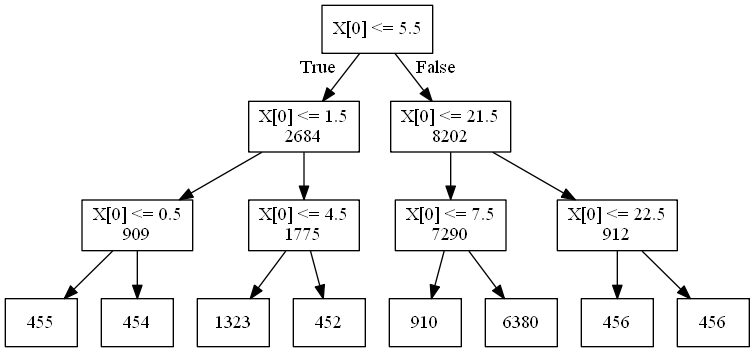

In [40]:
dot_data = tree.export_graphviz(dtree,out_file=None,
                                filled=None,
                               impurity=False,
                               label='root') 
# Draw graph
f= pydotplus.graph_from_dot_data(dot_data).to_string()
f = re.sub('(\\\\nsamples = [0-9]+)', '', f)
f=re.sub('(\\\\nvalue = \[[^]]*\])','',f)
f=re.sub('(\\\\n\[[^]]*\])','',f)

with open('Graphviz_files/tree_modified1.dot', 'w') as file:
    file.write(f)
    
PATH = 'Graphviz_files/tree_modified1.dot'
f = pydotplus.graph_from_dot_file(PATH)
Image(f.create_png())

In [41]:
total_data=pd.concat([train,test])

In [42]:
total_data['hbin_reg']=1
total_data.loc[(total_data['date_hour']>0.5) & (total_data['date_hour']<=1.5),'hbin_reg']=2
total_data.loc[(total_data['date_hour']>1.5) & (total_data['date_hour']<=4.5),'hbin_reg']=3
total_data.loc[(total_data['date_hour']>4.5) & (total_data['date_hour']<=5.5),'hbin_reg']=4
total_data.loc[(total_data['date_hour']>5.5) & (total_data['date_hour']<=7.5),'hbin_reg']=5
total_data.loc[(total_data['date_hour']>7.5) & (total_data['date_hour']<=21.5),'hbin_reg']=6
total_data.loc[(total_data['date_hour']>21.5) & (total_data['date_hour']<=22.5),'hbin_reg']=7
total_data.loc[(total_data['date_hour']>22.5),'hbin_reg']=8

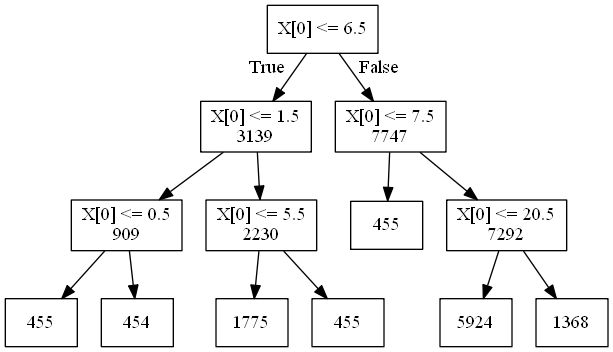

In [43]:
dtree=DecisionTreeClassifier(max_depth=3)
dtree.fit(train.date_hour.reshape(-1, 1),train.casual)

dot_data = tree.export_graphviz(dtree,out_file=None,
                                filled=None,
                               impurity=False,
                               label='root') 
# Draw graph
f= pydotplus.graph_from_dot_data(dot_data).to_string()
f = re.sub('(\\\\nsamples = [0-9]+)', '', f)
f=re.sub('(\\\\nvalue = \[[^]]*\])','',f)
f=re.sub('(\\\\n\[[^]]*\])','',f)

with open('Graphviz_files/tree_modified2.dot', 'w') as file:
    file.write(f)
    
PATH = 'Graphviz_files/tree_modified2.dot'
f = pydotplus.graph_from_dot_file(PATH)
Image(f.create_png())

In [44]:
total_data['hbin_cas']=1
total_data.loc[(total_data['date_hour']>0.5) & (total_data['date_hour']<=1.5),'hbin_cas']=2
total_data.loc[(total_data['date_hour']>1.5) & (total_data['date_hour']<=5.5),'hbin_cas']=3
total_data.loc[(total_data['date_hour']>5.5) & (total_data['date_hour']<=6.5),'hbin_cas']=4
total_data.loc[(total_data['date_hour']>6.5) & (total_data['date_hour']<=7.5),'hbin_cas']=5
total_data.loc[(total_data['date_hour']>7.5) & (total_data['date_hour']<=20.5),'hbin_cas']=6
total_data.loc[(total_data['date_hour']>20.5),'hbin_cas']=7

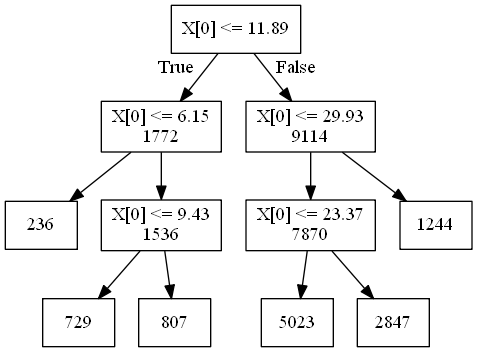

In [45]:
# Temp bins
# use decision trees to get bins for registered & casual users

dtree=DecisionTreeClassifier(max_leaf_nodes=6)
dtree.fit(train.temp.reshape(-1, 1),train.registered)

dot_data = tree.export_graphviz(dtree,out_file=None,
                                filled=None,
                               impurity=False,
                               label='root') 
# Draw graph
f= pydotplus.graph_from_dot_data(dot_data).to_string()
f = re.sub('(\\\\nsamples = [0-9]+)', '', f)
f=re.sub('(\\\\nvalue = \[[^]]*\])','',f)
f=re.sub('(\\\\n\[[^]]*\])','',f)

with open('Graphviz_files/tree_modified3.dot', 'w') as file:
    file.write(f)
    
PATH = 'Graphviz_files/tree_modified3.dot'
f = pydotplus.graph_from_dot_file(PATH)
Image(f.create_png())


In [46]:
total_data['temp_reg']=1
total_data.loc[(total_data['temp']>6.15) & (total_data['temp']<=9.43),'temp_reg']=2
total_data.loc[(total_data['temp']>9.43) & (total_data['temp']<=11.89),'temp_reg']=3
total_data.loc[(total_data['temp']>11.89) & (total_data['temp']<=23.37),'temp_reg']=4
total_data.loc[(total_data['temp']>23.37) & (total_data['temp']<=29.93),'temp_reg']=5
total_data.loc[(total_data['temp']>29.93),'temp_reg']=6

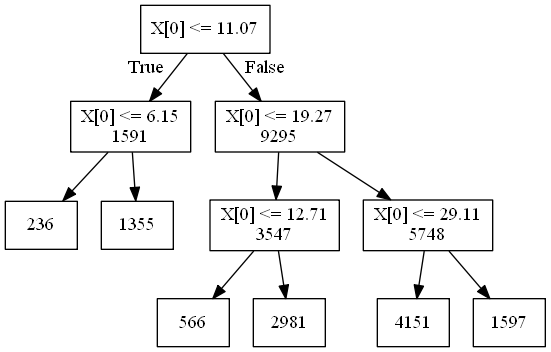

In [47]:
# Temp bins
# use decision trees to get bins for registered & casual users

dtree=DecisionTreeClassifier(max_leaf_nodes=6)
dtree.fit(train.temp.reshape(-1, 1),train.casual)

dot_data = tree.export_graphviz(dtree,out_file=None,
                                filled=None,
                               impurity=False,
                               label='root') 
# Draw graph
f= pydotplus.graph_from_dot_data(dot_data).to_string()
f = re.sub('(\\\\nsamples = [0-9]+)', '', f)
f=re.sub('(\\\\nvalue = \[[^]]*\])','',f)
f=re.sub('(\\\\n\[[^]]*\])','',f)

with open('Graphviz_files/tree_modified4.dot', 'w') as file:
    file.write(f)
    
PATH = 'Graphviz_files/tree_modified4.dot'
f = pydotplus.graph_from_dot_file(PATH)
Image(f.create_png())


In [48]:
total_data['temp_cas']=1
total_data.loc[(total_data['temp']>6.15) & (total_data['temp']<=11.07),'temp_cas']=2
total_data.loc[(total_data['temp']>11.07) & (total_data['temp']<=12.71),'temp_cas']=3
total_data.loc[(total_data['temp']>12.71) & (total_data['temp']<=19.27),'temp_cas']=4
total_data.loc[(total_data['temp']>19.27) & (total_data['temp']<=29.11),'temp_cas']=5
total_data.loc[(total_data['temp']>29.11),'temp_cas']=6

In [49]:
total_data['month']=total_data['datetime'].str[5:7]
total_data['month']=total_data['month'].astype(int)

In [50]:
total_data['date']=total_data['datetime'].str[8:10]
total_data['date']=total_data['date'].astype(object)

In [51]:
# Year bins
# Divide the two years into four quarters
total_data['year']=total_data['year'].astype(int)
total_data['year_term']=1
total_data.loc[(total_data['month']>3) &(total_data['month']<=6) & (total_data['year']==2011), 'year_term'] = 2
total_data.loc[(total_data['month']>6) &(total_data['month']<=9) & (total_data['year']==2011), 'year_term'] = 3
total_data.loc[(total_data['month']>9) &(total_data['month']<=12) & (total_data['year']==2011), 'year_term'] = 4
total_data.loc[(total_data['month']<=3) & (total_data['year']==2012), 'year_term'] = 5
total_data.loc[(total_data['month']>3) &(total_data['month']<=6) & (total_data['year']==2012), 'year_term'] = 6
total_data.loc[(total_data['month']>6) &(total_data['month']<=9) &(total_data['year']==2012), 'year_term'] = 7
total_data.loc[(total_data['month']>9) &(total_data['month']<=12) &(total_data['year']==2012), 'year_term'] = 8

In [52]:
# Day type
total_data['day_type']=np.where((total_data['holiday']==0) | (total_data['workingday']==0),'Weekend',
                                np.where((total_data['holiday']==1),'holiday','workingday'))

In [53]:
# Weekend

total_data['weekend']=np.where((total_data['day']=='Saturday') | (total_data['day']=='Sunday'),1,0)
total_data['weekend']=total_data['weekend'].astype(int)

In [54]:
# Convert month,year,hour to object
total_data['month']=total_data['month'].astype(object)
total_data['year']=total_data['year'].astype(object)
total_data['date_hour']=total_data['date_hour'].astype(object)

# Drop datetime column
result_id = total_data['datetime']
total_data.drop(['datetime'], axis=1, inplace=True)

In [55]:
cols = total_data.loc[:, total_data.dtypes == object].columns

In [56]:
cols

Index(['holiday', 'season', 'weather', 'workingday', 'date_hour', 'day',
       'year', 'month', 'date', 'day_type'],
      dtype='object')

In [57]:
total_data = pd.get_dummies(total_data, prefix=cols[1:], columns=cols[1:])

In [58]:
total_data.columns

Index(['atemp', 'casual', 'count', 'holiday', 'humidity', 'registered', 'temp',
       'windspeed', 'hbin_reg', 'hbin_cas',
       ...
       'date_23', 'date_24', 'date_25', 'date_26', 'date_27', 'date_28',
       'date_29', 'date_30', 'date_31', 'day_type_Weekend'],
      dtype='object', length=101)

In [59]:
# Model Predicition

train_data=total_data[:len(train_data)]
test_data=total_data[:len(test_data)]

target1=np.log1p(train_data.registered)
target2=np.log1p(train_data.casual)

train_data.drop(['casual','count','registered'], axis=1, inplace=True)
test_data.drop(['casual','count','registered'], axis=1, inplace=True)

In [60]:
sk = np.random.rand(len(train_data)) < 0.8

In [61]:
# Train and validation split
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(train_data, target1, test_size=0.33, random_state=42)

model1 = RandomForestRegressor(random_state=2)
model1.fit(X_train1,y_train1)

# Predict on new data
y1 = model1.predict(X_test1)

In [62]:
# Train and validation split
from sklearn.model_selection import train_test_split
X_train2, X_test2, y_train2, y_test2 = train_test_split(train_data, target2, test_size=0.33, random_state=42)

model2 = RandomForestRegressor(random_state=3)
model2.fit(X_train2,y_train2)

# Predict on new data
y2 = model2.predict(X_test2)

In [63]:
ypred=np.expm1(y1)+np.expm1(y2)
ytrue=np.expm1(y_test1)+np.expm1(y_test2)

from sklearn.metrics import mean_squared_error
mean_squared_error(np.log1p(ytrue), np.log1p(ypred))

0.098878267029097841

In [64]:
result1 = model1.predict(test_data)
result2=model2.predict(test_data)
result = np.expm1(result1)+np.expm1(result2)

# submission file
result_id = result_id[len(train_data):]
result_data = list(zip(result_id,result))

In [65]:
output = pd.DataFrame(result_data, columns=['datetime','count'])
#output.to_csv('submission.csv', sep=',', encoding='utf-8',index=None)